In [10]:
## Loading required package
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
from warnings import filterwarnings
filterwarnings('ignore')

import numpy as np
import pandas as pd
from math import sqrt
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")
import scipy.stats as stats

from fbprophet import Prophet

np.random.seed(42)

In [25]:
# File path 
base_dir = '/Users/chrisjcc/Desktop/DataInsight/DataChallenge/Bike-Sharing-Dataset/'
data_path = base_dir + 'hour.csv'

# Load data
data = pd.read_csv(data_path, parse_dates=True, squeeze=True)

In [26]:
# Quick check of proper loading of dataset
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [27]:
# Preprocessing: Renaming columns names to more readable names
data.rename(columns={'instant':'rec_id',
                     'dteday':'ds',
                     'holiday':'is_holiday',
                     'workingday':'is_workingday',
                     'weathersit':'weather_condition',
                     'hum':'humidity',
                     'mnth':'month',
                     'cnt': 'y',
                     'hr':'hour',
                     'yr':'year',
                    },inplace=True)

In [28]:
# Setting proper data types

# date time conversion
data['ds'] = pd.to_datetime(data.ds)

# categorical fetures
data['season']     = data.season.astype('category')
data['is_holiday'] = data.is_holiday.astype('category')
data['weekday']    = data.weekday.astype('category')
data['weather_condition'] = data.weather_condition.astype('category')
data['is_workingday']     = data.is_workingday.astype('category')
data['month'] = data.month.astype('category')
data['hour']  = data.hour.astype('category')
data['year']  = data.year.astype('category')

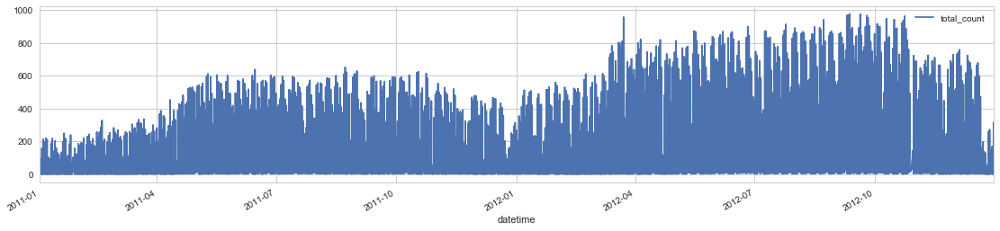

In [8]:
x = data[['DS', 'Y']].set_index(['datetime'])
x.plot(figsize=(19, 4))
plt.show()

### Additive model
By default Prophet fits additive seasonalities, meaning the effect of the seasonality is added to the trend to get the forecast. Prophet uses a linear model for its forecast.

In [29]:
# linear model for its forecast
x = data[['ds', 'y']]
m = Prophet(seasonality_mode='additive', daily_seasonality=True)
m.fit(x)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [30]:
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
17739,2013-12-27
17740,2013-12-28
17741,2013-12-29
17742,2013-12-30
17743,2013-12-31


In [31]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
17739,2013-12-27,164.711644,-54.132236,384.834519
17740,2013-12-28,159.763053,-67.464581,383.169121
17741,2013-12-29,146.217215,-80.680027,349.109646
17742,2013-12-30,153.108317,-68.819722,364.177116
17743,2013-12-31,159.598654,-56.622483,366.967434


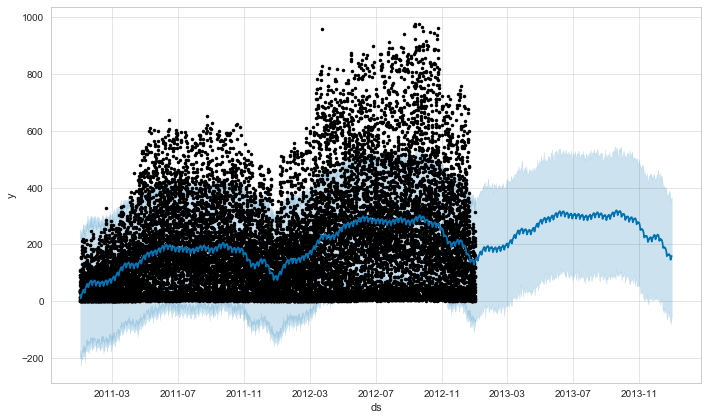

In [32]:
# plot the forecast 
fig1 = m.plot(forecast)

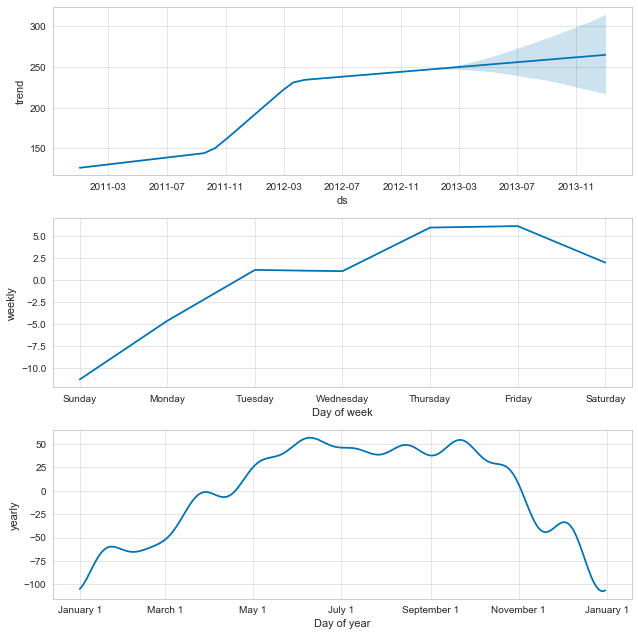

In [33]:
# to see the forecast components
fig2 = m.plot_components(forecast)

In [34]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

# interactive figure of the forecast
fig = plot_plotly(m, forecast)  # This returns a plotly Figure
py.iplot(fig)

###  Multiplicative model seasonality

In [35]:
m = Prophet(seasonality_mode='multiplicative', daily_seasonality=True)
m.fit(x)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [36]:
forecast = m.predict(future)

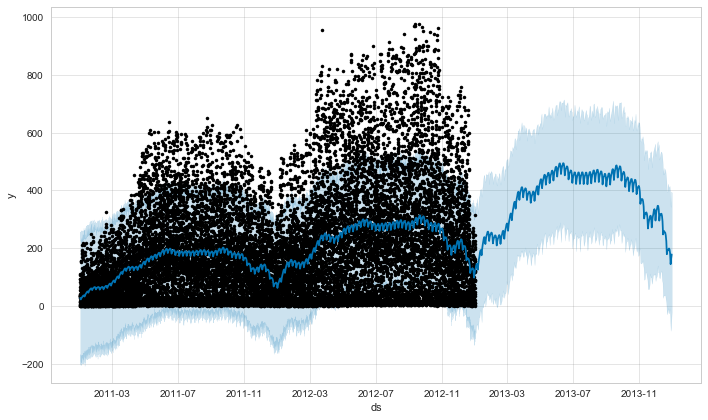

In [37]:
fig = m.plot(forecast)

The components figure will now show the seasonality as a percent of the trend.

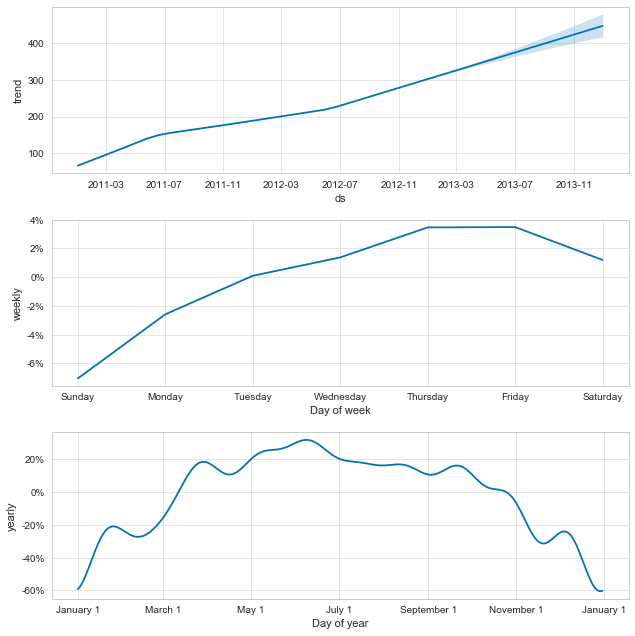

In [38]:
# to see the forecast components
fig2 = m.plot_components(forecast)

With seasonality_mode='multiplicative', holiday effects will also be modeled as multiplicative. Any added seasonalities or extra regressors will by default use whatever seasonality_mode is set to, but can be overriden by specifying mode='additive' or mode='multiplicative' as an argument when adding the seasonality or regressor.

In [ ]:
m = Prophet(seasonality_mode='multiplicative')
m.add_seasonality('quarterly', period=91.25, fourier_order=8, mode='additive')
m.add_regressor('regressor', mode='additive')

Additive and multiplicative extra regressors will show up in separate panels on the components plot.

In [41]:
from fbprophet.diagnostics import cross_validation

#df_cv = cross_validation(m, initial='730 days', period='180 days', horizon = '365 days')
df_cv = cross_validation(m, initial='365 days', period='180 days', horizon = '180 days')
df_cv.head()

INFO:fbprophet:Making 2 forecasts with cutoffs between 2012-01-06 00:00:00 and 2012-07-04 00:00:00


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2012-01-07,118.058876,-41.254686,271.422487,512,2012-01-06
1,2012-01-07,118.058876,-44.624236,268.172785,449,2012-01-06
2,2012-01-07,118.058876,-30.628619,280.638552,401,2012-01-06
3,2012-01-07,118.058876,-54.316305,269.690261,322,2012-01-06
4,2012-01-07,118.058876,-46.153714,272.607943,215,2012-01-06


Here we do cross-validation to assess prediction performance on a horizon of 365 days, starting with 730 days of training data in the first cutoff and then making predictions every 180 days. On this 8 year time series, this corresponds to 11 total forecasts.

In [42]:
from fbprophet.diagnostics import performance_metrics

df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,coverage
0,18 days,28866.865321,169.902517,128.199190,6.557663,0.753347
1,19 days,29426.271076,171.540873,128.735952,6.791843,0.758804
2,20 days,30876.205730,175.716265,130.820803,6.733869,0.756112
3,21 days,32876.418448,181.318555,134.257377,6.716388,0.749139
4,22 days,33793.981204,183.831393,136.252610,6.660701,0.743791


 compute some useful statistics of the prediction performance (yhat, yhat_lower, and yhat_upper compared to y), as a function of the distance from the cutoff (how far into the future the prediction was). The statistics computed are mean squared error (MSE), root mean squared error (RMSE), mean absolute error (MAE), mean absolute percent error (MAPE), and coverage of the yhat_lower and yhat_upper estimates. These are computed on a rolling window of the predictions in df_cv after sorting by horizon (ds minus cutoff). By default 10% of the predictions will be included in each window, but this can be changed with the rolling_window argument.

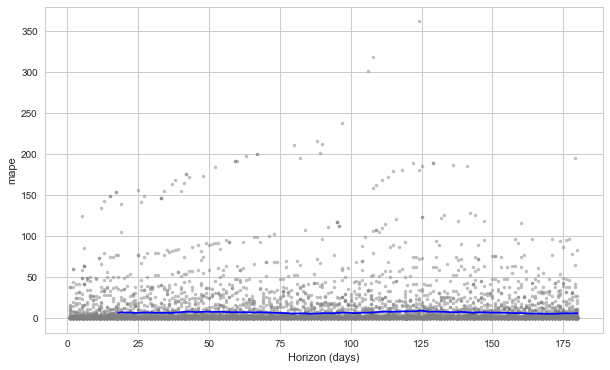

In [43]:
from fbprophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='mape')

The blue line shows the MAPE, where the mean is taken over a rolling window of the dots. We see for this forecast that errors around 5% are typical for predictions one month into the future, and that errors increase up to around 11% for predictions that are a year out.